### - Do we know it's biosemi? 
### - Does order in ch_locs match order in data?

In [2]:
from scipy.io import loadmat
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.loadmat.html

import matplotlib.pyplot as plt
import numpy as np
import mne
import os
import pandas as pd

In [3]:
dataDir = r'D:\marion_music_imagery\datasetCND_musicImagery\musicImagery'

# Get data about experiment conditions

In [4]:
stim_mat = loadmat(dataDir+r"/dataCND/dataStim.mat", simplify_cells = True) 
stim = stim_mat['stim']
print(stim)
# How do we read stim? Its an empty-shaped array...

{'stimIdxs': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
      dtype=uint8), 'condIdxs': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
      dtype=uint8), 'condNames': array(['Listening', 'Imagery'], dtype=object), 'data': array([[array([0.28676142, 0.27906154, 0.26226445, ..., 0.12532383, 0.12300036,
               0.12128167])                                                    ,
        array([0.28676142, 0.27906154, 0.26226445, ..., 0.12532383, 0.12300036,
               0.12128167])             

In [5]:
stim_mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'stim'])

In [6]:
stim.keys()

dict_keys(['stimIdxs', 'condIdxs', 'condNames', 'data', 'names', 'fs'])

In [7]:
stimIdxs = stim['stimIdxs']
print(f'stimIdxs shape (N trials): {stimIdxs.shape}')

condIdxs = stim['condIdxs']
print(f'condIdxs shape (N trials): {condIdxs.shape}')

condNames = stim['condNames']
print(f'condNames shape (P conditions): {condNames.shape}')

events = stim['data']
print(f'events shape (M features, N trials): {events.shape}')

event_labels = stim['names']
print(f'event names shape (M features): {event_labels.shape}')

fs = stim['fs']
print(f'fs shape: {stimIdxs.shape}')

stimIdxs shape (N trials): (88,)
condIdxs shape (N trials): (88,)
condNames shape (P conditions): (2,)
events shape (M features, N trials): (2, 88)
event names shape (M features): (2,)
fs shape: (88,)


In [8]:
fs

64

In [9]:
stimIdxs

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
      dtype=uint8)

In [10]:
event_labels

array(['Acoustic Envelope', 'Expectation Vector'], dtype=object)

In [11]:
condNames

array(['Listening', 'Imagery'], dtype=object)

In [12]:
condIdxs

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
      dtype=uint8)

In [13]:
events[0,:][0].shape[0] /64 #len of ea trial

28.171875

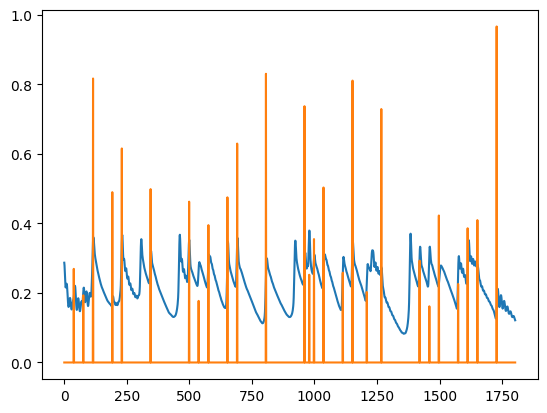

In [14]:
plt.plot(events[0,:][0]) # acoustic envelope of first trial
plt.plot(events[1,:][0]/10) # expectations of first trial

In [15]:
events[1,:][87]

array([0., 0., 0., ..., 0., 0., 0.])

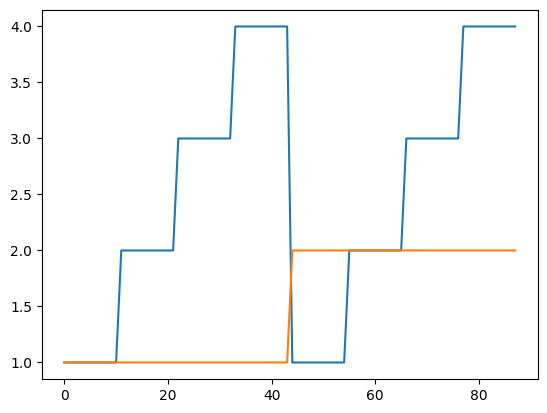

In [16]:
plt.plot(stimIdxs)
plt.plot(condIdxs)

# Load the files for one subject and examine data

In [17]:
sub1_mat = loadmat(dataDir+r"/dataCND/dataSub1.mat", simplify_cells = True) 

In [18]:
sub1_mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'eeg', '__function_workspace__'])

In [19]:
sub1_mat['eeg'].keys()

dict_keys(['dataType', 'fs', 'data', 'chanlocs', 'origTrialPosition', 'deviceName'])

In [20]:
len(sub1_mat['eeg']['chanlocs'])

64

In [21]:
sub1_mat['eeg']['chanlocs']

[{'Y': 0.30883,
  'X': 0.95048,
  'Z': -0.034899,
  'labels': 'Fp1',
  'sph_theta': 18.00001784,
  'sph_phi': -1.999965382,
  'sph_radius': 1.00000307,
  'theta': -18.00001784,
  'radius': 0.511110919,
  'urchan': 93},
 {'Y': 0.58743,
  'X': 0.80852,
  'Z': -0.034899,
  'labels': 'AF7',
  'sph_theta': 36.00027065,
  'sph_phi': -1.99997499,
  'sph_radius': 0.999998268,
  'theta': -36.00027065,
  'radius': 0.511110972,
  'urchan': 94},
 {'Y': 0.30478,
  'X': 0.93801,
  'Z': 0.16505,
  'labels': 'AF3',
  'sph_theta': 18.00011468,
  'sph_phi': 9.50016252,
  'sph_radius': 0.999997555,
  'theta': -18.00011468,
  'radius': 0.447221319,
  'urchan': 92},
 {'Y': 0.27528,
  'X': 0.66458,
  'Z': 0.69466,
  'labels': 'F1',
  'sph_theta': 22.50014355,
  'sph_phi': 44.00018041,
  'sph_radius': 0.999999085,
  'theta': -22.50014355,
  'radius': 0.255554553,
  'urchan': 89},
 {'Y': 0.59637,
  'X': 0.59637,
  'Z': 0.5373,
  'labels': 'F3',
  'sph_theta': 45,
  'sph_phi': 32.4999236,
  'sph_radius': 1.000

In [22]:
dataType = sub1_mat['eeg']['dataType']
print(f'dataType shape: {dataType.shape}')

fs = sub1_mat['eeg']['fs']
print(f'fs: {fs}')

data = sub1_mat['eeg']['data']
print(f'data shape: {data.shape}')

orig_trial_pos = sub1_mat['eeg']['origTrialPosition']
print(f'orig_trial_pos shape: {orig_trial_pos.shape}')


dataType shape: (1,)
fs: 64
data shape: (88,)
orig_trial_pos shape: (88,)


In [23]:
data[0].shape #(times, chans)

(1803, 64)

In [24]:
sub1_mat['eeg']['origTrialPosition']-1 # subtracting one to make it zero indexed

array([ 2,  8, 14, 15, 26, 27, 29, 36, 47, 48, 52,  3,  6, 11, 28, 33, 34,
       37, 51, 58, 62, 70,  7, 10, 21, 23, 30, 35, 38, 39, 66, 74, 86, 12,
       17, 24, 44, 45, 49, 54, 55, 56, 64, 76, 18, 19, 31, 32, 41, 57, 61,
       69, 79, 84, 87,  1, 25, 42, 43, 46, 59, 60, 67, 68, 73, 85,  0, 13,
       16, 22, 40, 63, 71, 75, 77, 78, 83,  4,  5,  9, 20, 50, 53, 65, 72,
       80, 81, 82], dtype=uint8)

In [25]:
thisSubCondOrder = condIdxs[(orig_trial_pos-1)] # convert to being zero indexed

In [26]:
thisSubStimOrder = stimIdxs[(orig_trial_pos-1)] # convert to being zero indexed
thisSubStimOrder

array([1, 1, 2, 2, 3, 3, 3, 4, 1, 1, 1, 1, 1, 2, 3, 4, 4, 4, 1, 2, 2, 3,
       1, 1, 2, 3, 3, 4, 4, 4, 3, 3, 4, 2, 2, 3, 1, 1, 1, 1, 2, 2, 2, 3,
       2, 2, 3, 3, 4, 2, 2, 3, 4, 4, 4, 1, 3, 4, 4, 1, 2, 2, 3, 3, 3, 4,
       1, 2, 2, 3, 4, 2, 3, 3, 4, 4, 4, 1, 1, 1, 2, 1, 1, 2, 3, 4, 4, 4],
      dtype=uint8)

In [27]:
thisSubAcousticEnv = events[0][(orig_trial_pos-1)] # reorder according to the trial order
thisSubExpectations = events[1][(orig_trial_pos-1)]

In [28]:
thisSubExpectations.shape

(88,)

# grab the event timing from the audio files

### Compile the timing from the Midi files, the wav files, and the expectation markers all into one dictionary

In [29]:
#song_id = {}
# song_id['chor-019.wav'] = 4
# song_id['chor-101.wav'] = 3
# song_id['chor-096.wav'] = 1
# song_id['chor-038.wav'] = 2

song_events_dict ={}
labels = ['chor-019','chor-038','chor-096','chor-101']
stimId_labels = [4, 2, 1, 3] 
for i in range(len(labels)):
    song_id = labels[i]
    song_events_dict[song_id]={}
    song_events_dict[song_id]['stimIdLabel']=stimId_labels[i]

    song_events_dict[song_id]['note_events_array'] = np.load(os.getcwd()+'\events_array_'+song_id+'.npy')
    for arr_type in ['audio','metronome','time']:
        song_events_dict[song_id][arr_type+'_wav_array'] = np.load(os.getcwd()+'\wavFileExtract_'+song_id+'_'+arr_type+'.npy')

In [30]:
song_events_dict.keys()

dict_keys(['chor-019', 'chor-038', 'chor-096', 'chor-101'])

### try an example song, with the first trial of this subject's session (during which the chor-096 song played)

In [31]:
## getting the midi notes, and metronome e timing from the wav file
events_chor096 = song_events_dict['chor-096']['note_events_array']
metro_chor096 = song_events_dict['chor-096']['metronome_wav_array']
time_chor096 = song_events_dict['chor-096']['time_wav_array']

events_chor096[:4] # shape (note id, onset, offset)

array([[  65.,    0.,  600.],
       [  65.,  600., 1200.],
       [  65., 1200., 1800.],
       [  70., 1800., 3000.]])

In [32]:
# reformatting the midi notes and their onsets for plotting 
extract_ids_y =[]
extract_times_x = []
extract_times_off = []
for evs in events_chor096:
    extract_ids_y.append(evs[0]-65) # just subtracting for plotting purposes, so the scale is comparable with the expectations and metronome on the y-axis 
    extract_times_x.append(evs[1]/1000) # grab the onsets, in terms of seconds
    extract_times_off.append(evs[2]/1000) # grab the offets, in terms of seconds
extract_ids_y = np.asarray(extract_ids_y)
extract_times_x = np.asarray(extract_times_x)

In [33]:
extract_times_x

array([ 0. ,  0.6,  1.2,  1.8,  3. ,  3.6,  4.8,  5.4,  7.2,  7.8,  8.4,
        9. , 10.2, 10.8, 12.6, 14.4, 15. , 15.3, 15.6, 16.2, 17.4, 18. ,
       18.9, 19.2, 19.8, 21.6, 22.2, 22.8, 23.4, 24.6, 25.2, 25.8, 27. ])

In [34]:
# just curious about the durations of the notes
extract_times_off - extract_times_x # longest note lasts 1.8 seconds it seems

array([0.6, 0.6, 0.6, 1.2, 0.6, 1.2, 0.6, 1.8, 0.6, 0.6, 0.6, 1.2, 0.6,
       1.8, 1.8, 0.6, 0.3, 0.3, 0.6, 1.2, 0.6, 0.9, 0.3, 0.6, 1.8, 0.6,
       0.6, 0.6, 1.2, 0.6, 0.6, 1.2, 1.8])

In [35]:
# get the expectations from the first trial, during which our song chor-096 played
expect_trialOne = events[1,:][0]
# and make the timestamps comparable to the others
expect_x = np.asarray(np.arange(len(expect_trialOne))/64) # get in terms of seconds
#plt.plot(expect_x,expect_trialOne)
expect_x

array([0.0000000e+00, 1.5625000e-02, 3.1250000e-02, ..., 2.8125000e+01,
       2.8140625e+01, 2.8156250e+01])

In [36]:
print(events_chor096.shape)
print(metro_chor096.shape)
print(expect_trialOne.shape)

(33, 3)
(1483699,)
(1803,)


## Checking that the timing is all aligned between the expectations, note onset from the Midi files, and metronome from the wav files

In [37]:

# fig, ax = plt.subplots(figsize=(16, 4))
# plt.plot(expect_x, events[0,:][0]*10) # acoustic envelope of first trial
# plt.plot(extract_times_x,extract_ids_y/3, marker='o')
# plt.plot(expect_x, expect_trialOne)
# plt.plot(time_chor096/1000,metro_chor096*10) # time in terms of seconds
# plt.show()

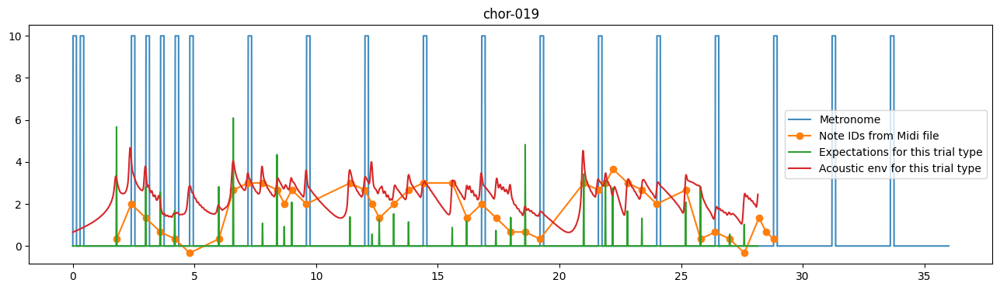

C:\Users\dillc\AppData\Roaming\Python\Python39\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


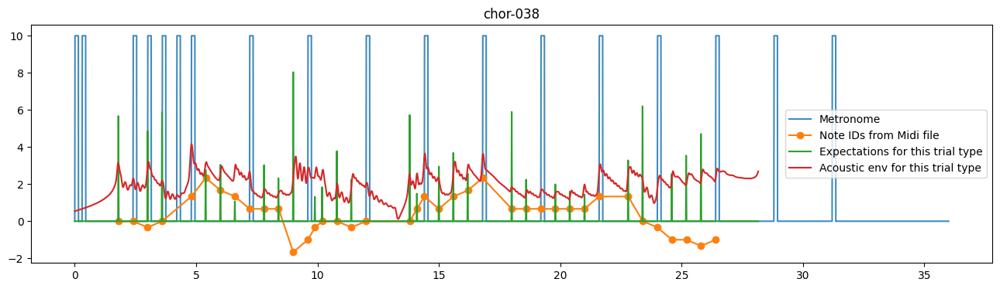

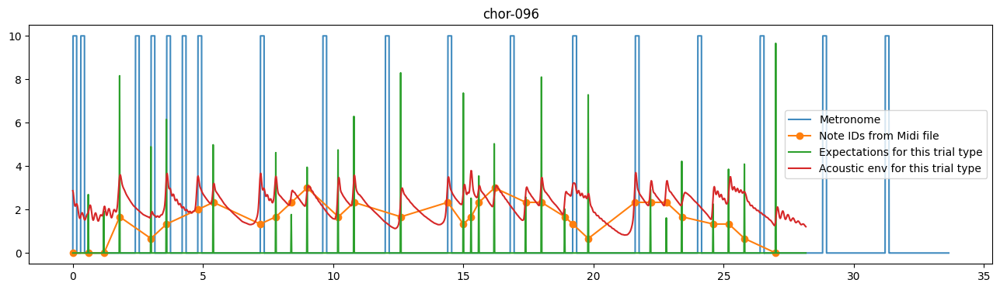

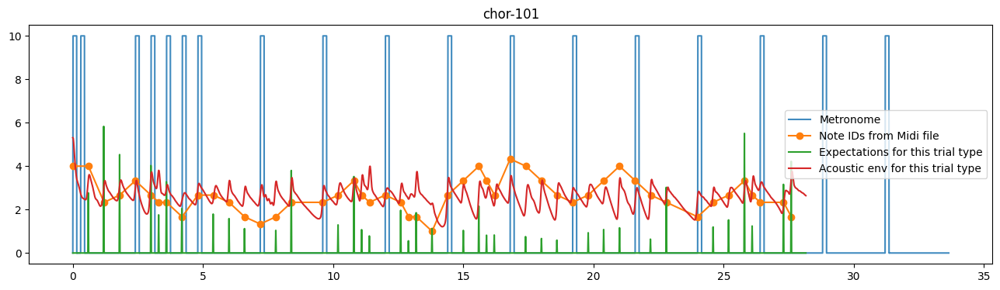

In [38]:
labels = ['chor-019','chor-038','chor-096','chor-101']

for i in range(len(labels)):
    
    label = labels[i]
    stim_id_label = song_events_dict[label]['stimIdLabel']

    all_expectations_of_this_song = thisSubExpectations[thisSubStimOrder == stim_id_label] #the expectations sorted according to trial order for this subject
    ex_trial_expectation = all_expectations_of_this_song[0] # pick the first array among all the trials in which this song played

    
    all_acousticEnvs_of_this_song = thisSubAcousticEnv[thisSubStimOrder == stim_id_label] #the expectations sorted according to trial order for this subject
    ex_trial_acousEnvs = all_acousticEnvs_of_this_song[0] # pick the first array among all the trials in which this song played

    events_chor096 = song_events_dict[label]['note_events_array']
    metro_chor096 = song_events_dict[label]['metronome_wav_array']
    time_chor096 = song_events_dict[label]['time_wav_array']

    events_chor096[:4] # shape (note id, onset, offset)

    extract_ids_y =[]
    extract_times_x = []
    extract_times_off = []
    for evs in events_chor096:
        extract_ids_y.append(evs[0]-65)
        extract_times_x.append(evs[1]/1000) # grab the onsets, in terms of seconds
        extract_times_off.append(evs[2]/1000) # grab the onsets, in terms of seconds
    extract_ids_y = np.asarray(extract_ids_y)
    extract_times_x = np.asarray(extract_times_x)

    expect_trialOne = ex_trial_expectation
    expect_x = np.asarray(np.arange(len(expect_trialOne))/64) # get in terms of seconds
    #plt.plot(expect_x,expect_trialOne)
    expect_x

        
    fig, ax = plt.subplots(figsize=(16, 4))
    plt.title(label)
    plt.plot(time_chor096/1000,metro_chor096*10, label='Metronome', alpha=0.85) # time in terms of seconds
    plt.plot(extract_times_x,extract_ids_y/3, marker='o', label='Note IDs from Midi file')
    plt.plot(expect_x, expect_trialOne, label='Expectations for this trial type')
    plt.plot(expect_x, ex_trial_acousEnvs*10, label='Acoustic env for this trial type') # acoustic envelope of this trial
    plt.legend()
    plt.show()
    


# construct event arrays for each trial type (song type)

##### (Note that the timing between the expectations and the notes don't match entirely. This is probably due to different sampling rates, so we'll just try rounding up)

In [61]:
import librosa
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
# For each song type we'll want to use the expectation markers as our method of extracting the note identity. We'll have to match the timing of these by getting the timing of the expectation mark and using this as a reference to the note id scheme. 
# this will work as long as the expectation is the same length as the data, and the timing of the note identity aligns with the timing of the expectation mark

def render_event_array(expectations_this_trial, this_song_label, data_this_trial, fs):

    # assuming data has already been transposed as is shape (chan,times)
    assert data_this_trial.shape[1] == expectations_this_trial.shape[0] # expect it to be len 1803

    # get the times of each expectation event
    expectations_this_trial_times = np.asarray(np.round(np.arange(len(expectations_this_trial))/fs, decimals=1)) # in seconds, and rounding up so that it matches the note timing resolution

    # get the expected note values for this song, and their corresponding onset/offset times
    this_song_note_events = song_events_dict[this_song_label]['note_events_array']
    extract_Note_ids =[]
    extract_Note_times_ON = []
    extract_Note_times_OFF = []
    for evs in this_song_note_events:
        extract_Note_ids.append(evs[0]) # grabbing the note ID from the midi files
        extract_Note_times_ON.append(evs[1]/1000) # grab the onsets, in terms of seconds
        extract_Note_times_OFF.append(evs[2]/1000) # grab the offsets, in terms of seconds
    extract_Note_ids = np.asarray(extract_Note_ids)
    extract_Note_times_ON = np.asarray(extract_Note_times_ON)
    extract_Note_times_OFF = np.asarray(extract_Note_times_OFF)

    # get an array of how long each note lasts for this song
    note_durations= extract_Note_times_OFF - extract_Note_times_ON
    # we can epoch according to the shortest note, but its good to know how long they last
    min_note_dur, max_note_dur = np.min(note_durations), np.max(note_durations)

    ev_array = []
    metadata_evs = pd.DataFrame()
    ## LOOP through the samples of the expectations and extract the note identity
    for timepoint in range(data_this_trial.shape[1]):
        # loop through each timepoint, grab out the corresponding expectation value
        expect_this_time = expectations_this_trial[timepoint]

        # if the expecation value is zero, then we don't care about it.
        # but if its anything greater than zero, this indicates it's a note we care about
        if expect_this_time != 0:
            # if there's an expectation at this sample, grab out the equivalent timepoint in the note_id array
            expect_noteTime = expectations_this_trial_times[timepoint]
            note_id_thisTimepoint = extract_Note_ids[extract_Note_times_ON == expect_noteTime]
            
            #print(note_id_thisTimepoint)
            # make sure there's only one note happening at this sample
            assert len(note_id_thisTimepoint) == 1

            # and append it to our events array
            ev_array.append([timepoint, 0, int(note_id_thisTimepoint[0]) ])
            metadata_evs = metadata_evs.append({'song_type':this_song_label, 'midi_note_label':note_id_thisTimepoint[0], 'str_note_label': librosa.midi_to_note(int(note_id_thisTimepoint[0])),
                                                'expectation_value':expect_this_time, 
                                                'note_dur':(extract_Note_times_OFF[np.where(extract_Note_times_ON == expect_noteTime)[0]])-(expect_noteTime)}, ignore_index=True)

    assert len(ev_array) == np.sum(expectations_this_trial != 0)  

    return extract_Note_ids, extract_Note_times_ON, expectations_this_trial_times[expectations_this_trial != 0 ], ev_array, min_note_dur, max_note_dur, metadata_evs


In [62]:
stim_id_label = song_events_dict['chor-096']['stimIdLabel']

all_expectations_of_this_song = thisSubExpectations[thisSubStimOrder == stim_id_label] #the expectations sorted according to trial order for this subject
ex_trial_expectation = all_expectations_of_this_song[0] # pick the first array among all the trials in which this song played

all_acousticEnvs_of_this_song = thisSubAcousticEnv[thisSubStimOrder == stim_id_label] #the expectations sorted according to trial order for this subject
ex_trial_acousEnvs = all_acousticEnvs_of_this_song[0] # pick the first array among all the trials in which this song played

ex_trial_data = data[thisSubStimOrder == stim_id_label][0]

note_ids_from_midi, note_onsets_from_midi, expectations_times,  ev_array, min_note_dur, max_note_dur, _ = render_event_array(expectations_this_trial= ex_trial_expectation, this_song_label= 'chor-096', data_this_trial=ex_trial_data.T, fs=64)

print("Timing of Notes [extracted from Midi]")
print(note_onsets_from_midi)

print("Timing of Notes [extracted from Expectations]")
print(expectations_times)

print(ev_array)

Timing of Notes [extracted from Midi]
[ 0.   0.6  1.2  1.8  3.   3.6  4.8  5.4  7.2  7.8  8.4  9.  10.2 10.8
 12.6 14.4 15.  15.3 15.6 16.2 17.4 18.  18.9 19.2 19.8 21.6 22.2 22.8
 23.4 24.6 25.2 25.8 27. ]
Timing of Notes [extracted from Expectations]
[ 0.6  1.2  1.8  3.   3.6  5.4  7.8  8.4  9.  10.2 10.8 12.6 15.  15.3
 15.6 16.2 17.4 18.  18.9 19.8 22.2 22.8 23.4 24.6 25.2 25.8 27. ]
[[38, 0, 65], [76, 0, 65], [115, 0, 70], [192, 0, 67], [230, 0, 69], [345, 0, 72], [499, 0, 70], [537, 0, 72], [576, 0, 74], [652, 0, 70], [691, 0, 72], [806, 0, 70], [960, 0, 69], [979, 0, 70], [998, 0, 72], [1036, 0, 74], [1113, 0, 72], [1152, 0, 72], [1209, 0, 70], [1267, 0, 67], [1420, 0, 72], [1459, 0, 72], [1497, 0, 70], [1574, 0, 69], [1612, 0, 69], [1651, 0, 67], [1728, 0, 65]]


In [65]:
stim_id_label = song_events_dict['chor-038']['stimIdLabel']

all_expectations_of_this_song = thisSubExpectations[thisSubStimOrder == stim_id_label] #the expectations sorted according to trial order for this subject
ex_trial_expectation = all_expectations_of_this_song[0] # pick the first array among all the trials in which this song played

all_acousticEnvs_of_this_song = thisSubAcousticEnv[thisSubStimOrder == stim_id_label] #the expectations sorted according to trial order for this subject
ex_trial_acousEnvs = all_acousticEnvs_of_this_song[0] # pick the first array among all the trials in which this song played

ex_trial_data = data[thisSubStimOrder == stim_id_label][0]

note_ids_from_midi, note_onsets_from_midi, expectations_times,  ev_array, min_note_dur, max_note_dur, _ = render_event_array(expectations_this_trial= ex_trial_expectation, this_song_label= 'chor-038', data_this_trial=ex_trial_data.T, fs=64)

print("Timing of Notes [extracted from Midi]")
print(note_onsets_from_midi)

print("Timing of Notes [extracted from Expectations]")
print(expectations_times)

print(ev_array)

Timing of Notes [extracted from Midi]
[ 1.8  2.4  3.   3.6  4.8  5.4  6.   6.6  7.2  7.8  8.4  9.   9.6  9.9
 10.2 10.8 11.4 12.  13.8 14.1 14.4 15.  15.6 16.2 16.8 18.  18.6 19.2
 19.8 20.4 21.  21.6 22.8 23.4 24.  24.6 25.2 25.8 26.4]
Timing of Notes [extracted from Expectations]
[ 1.8  3.   3.6  5.4  6.   6.6  7.8  8.4  9.   9.9 10.2 10.8 11.4 13.8
 14.1 15.  15.6 16.2 18.  18.6 19.8 20.4 21.  22.8 23.4 24.6 25.2 25.8]
[[115, 0, 65], [192, 0, 64], [230, 0, 65], [345, 0, 72], [384, 0, 70], [422, 0, 69], [499, 0, 67], [537, 0, 67], [576, 0, 60], [633, 0, 64], [652, 0, 65], [691, 0, 65], [729, 0, 64], [883, 0, 65], [902, 0, 67], [960, 0, 67], [998, 0, 69], [1036, 0, 70], [1152, 0, 67], [1190, 0, 67], [1267, 0, 67], [1305, 0, 67], [1344, 0, 67], [1459, 0, 69], [1497, 0, 65], [1574, 0, 62], [1612, 0, 62], [1651, 0, 61]]



# Loop through all trials and create raw MNE objs

In [66]:
note_id_humanReadable = {'F♯4': 66,
                        'B4': 71,
                        'A4': 69,
                        'G4': 67,
                        'E4': 64,
                        'C♯5': 73,
                        'D5': 74,
                        'E5': 76,
                        'F4': 65,
                        'C5': 72,
                        'A♯4': 70,
                        'C4': 60,
                        'D4': 62,
                        'C♯4': 61,
                        'F5': 77,
                        'D♯5': 75,
                        'G♯4': 68,
                        'F♯5': 78 }

In [67]:
stimId_to_Song_map = {4: 'chor-019', 2: 'chor-038', 1:'chor-096', 3:'chor-101'}
condId_to_State_map = {1: 'Listening', 2: 'Imagery'}

In [68]:
song_events_dict ={}
labels = ['chor-019','chor-038','chor-096','chor-101']
stimId_labels = [4, 2, 1, 3] 
for i in range(len(labels)):
    song_id = labels[i]
    song_events_dict[song_id]={}
    song_events_dict[song_id]['stimIdLabel']=stimId_labels[i]

    song_events_dict[song_id]['note_events_array'] = np.load(os.getcwd()+'\events_array_'+song_id+'.npy')
    for arr_type in ['audio','metronome','time']:
        song_events_dict[song_id][arr_type+'_wav_array'] = np.load(os.getcwd()+'\wavFileExtract_'+song_id+'_'+arr_type+'.npy')

In [69]:
sub1_mat['eeg']['chanlocs'][0]

{'Y': 0.30883,
 'X': 0.95048,
 'Z': -0.034899,
 'labels': 'Fp1',
 'sph_theta': 18.00001784,
 'sph_phi': -1.999965382,
 'sph_radius': 1.00000307,
 'theta': -18.00001784,
 'radius': 0.511110919,
 'urchan': 93}

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
27 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


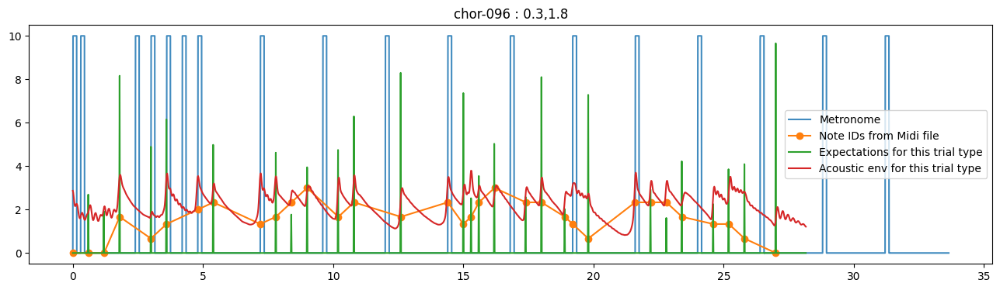

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
27 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


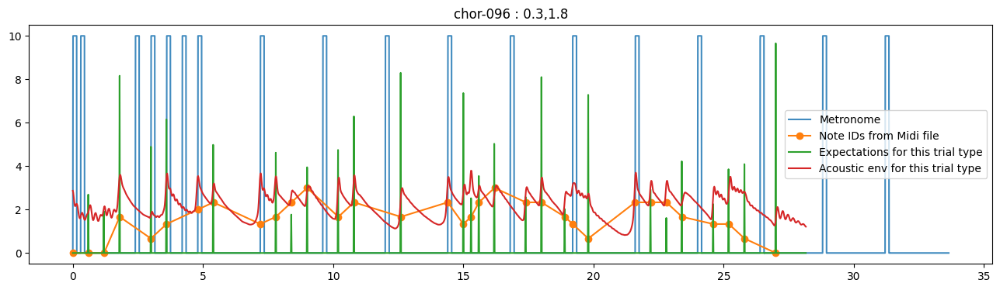

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
28 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


C:\Users\dillc\AppData\Roaming\Python\Python39\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


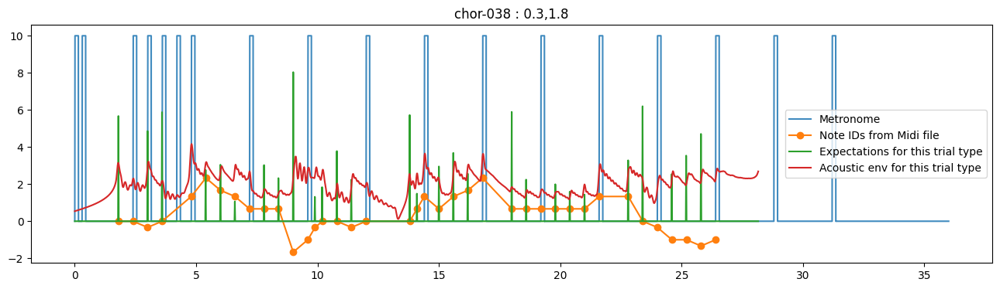

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
28 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


C:\Users\dillc\AppData\Roaming\Python\Python39\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


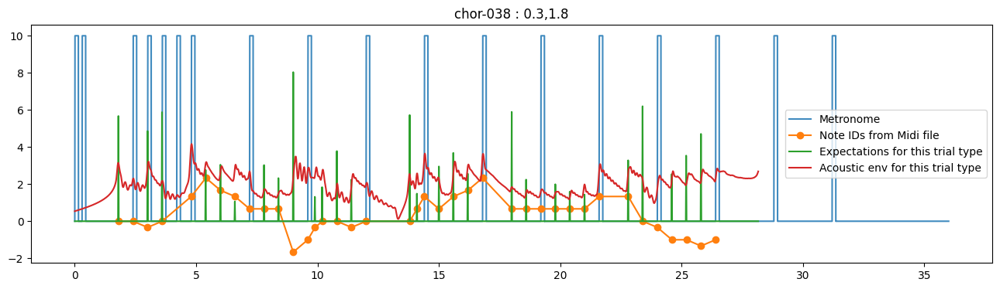

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
38 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


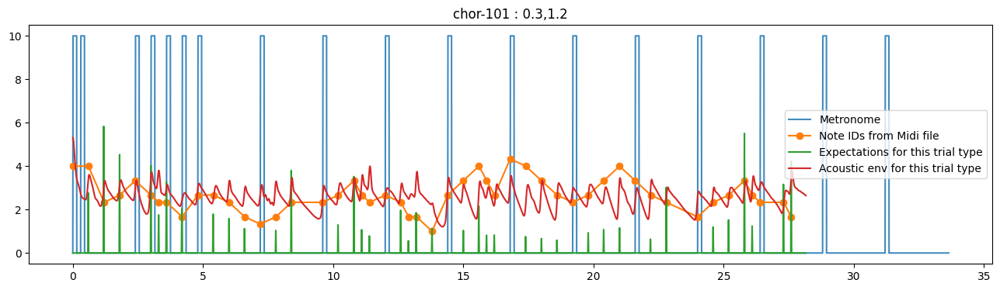

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
38 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


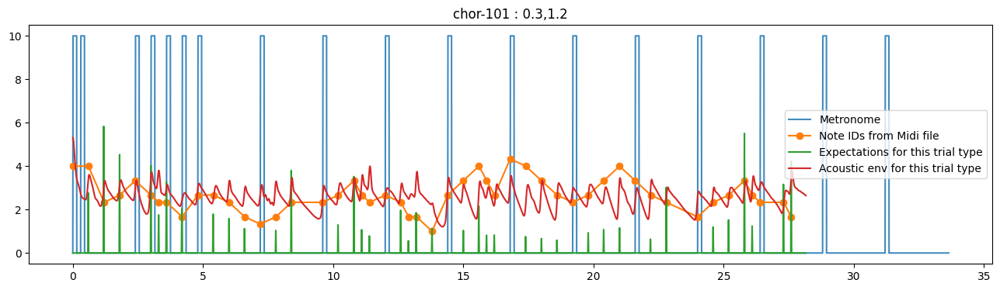

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
38 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


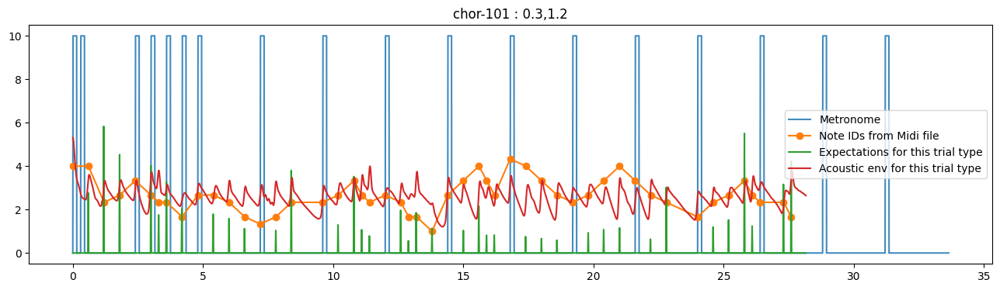

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
29 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


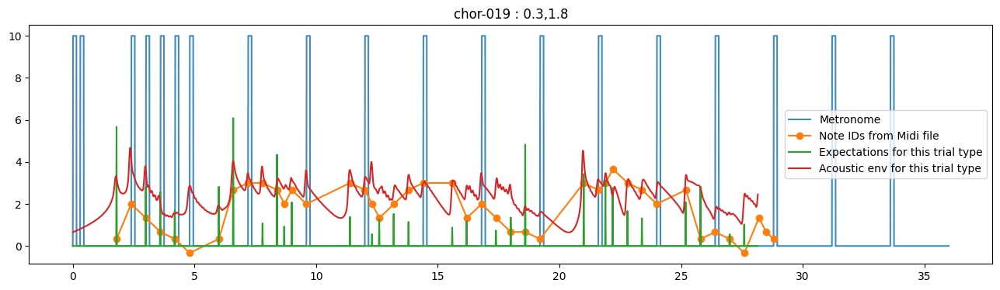

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
27 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


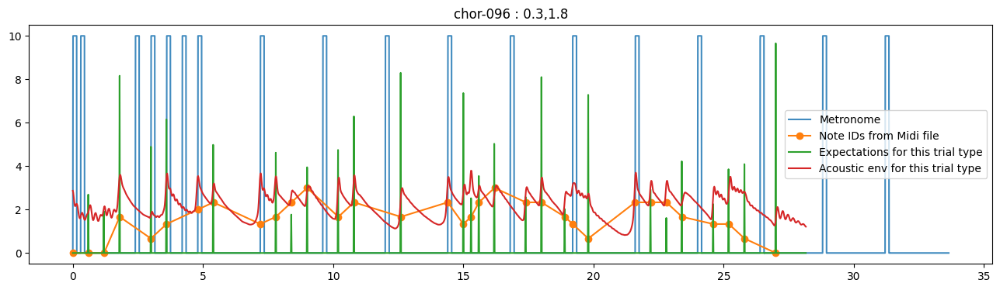

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
27 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


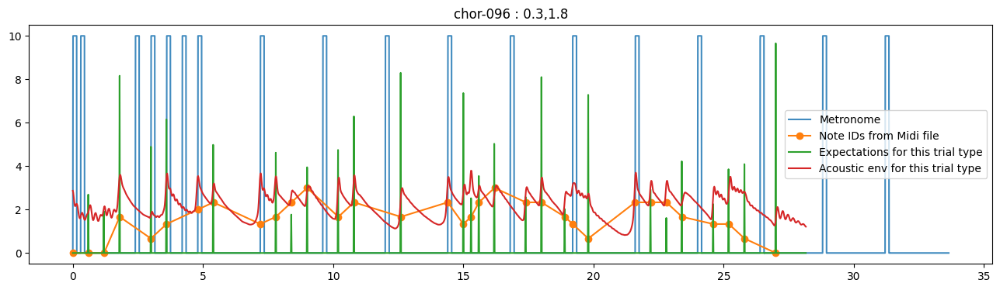

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
27 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


C:\Users\dillc\AppData\Roaming\Python\Python39\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


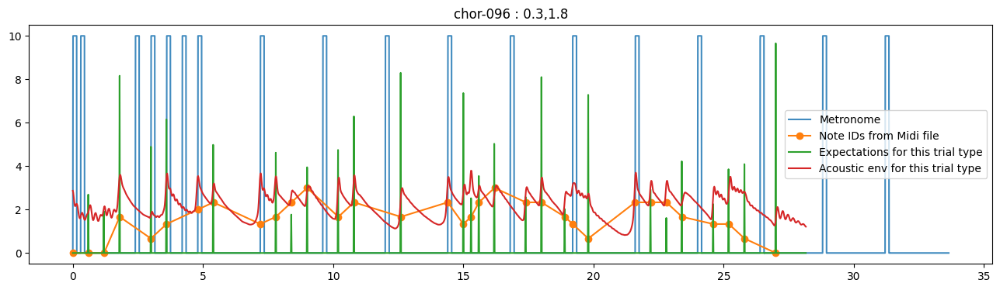

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
27 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


C:\Users\dillc\AppData\Roaming\Python\Python39\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


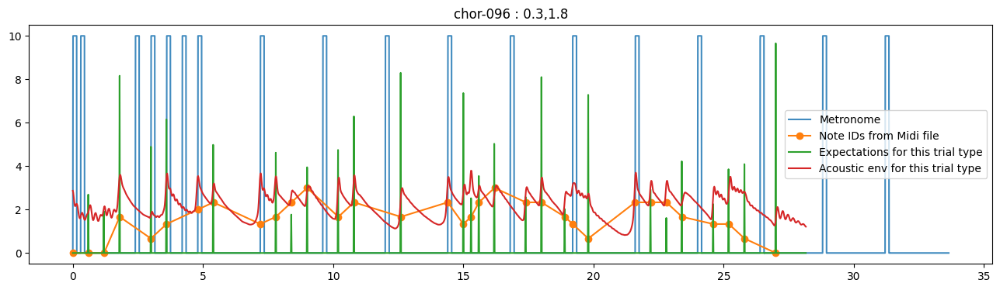

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
27 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


C:\Users\dillc\AppData\Roaming\Python\Python39\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


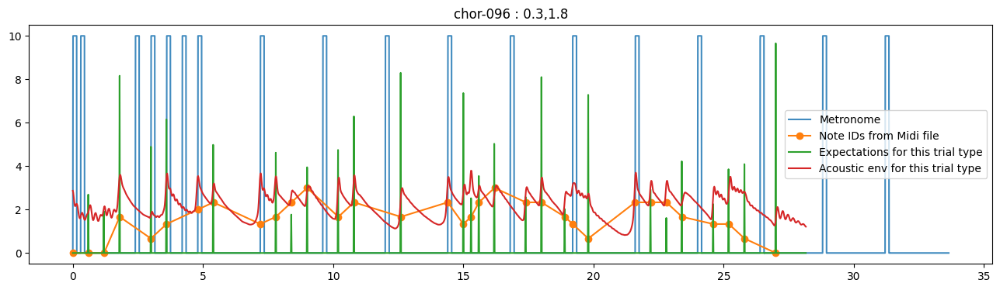

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
28 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


C:\Users\dillc\AppData\Roaming\Python\Python39\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


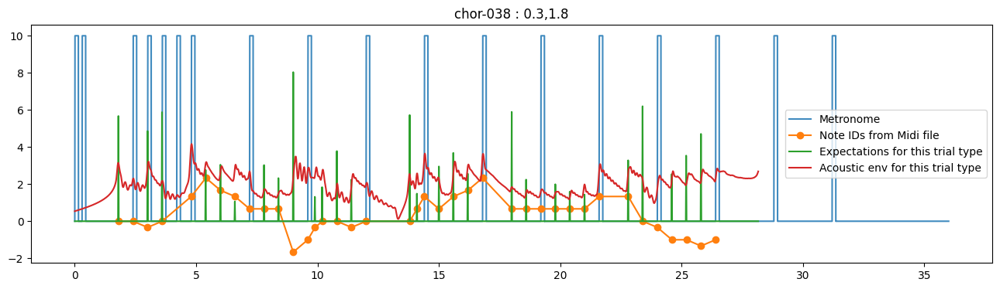

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
38 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated


C:\Users\dillc\AppData\Roaming\Python\Python39\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


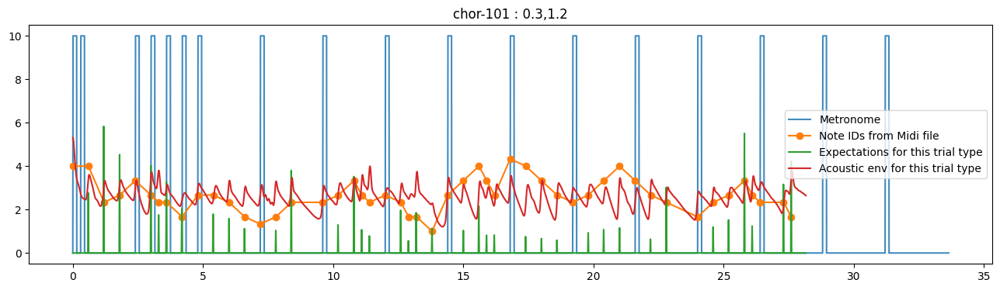

Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
29 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
29 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Adding metadata with 5 columns
29 matching events found
Setting baseline interval to [-0.5, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Creating RawArray with float64 data, n_channels=65, n_times=1803
    Range : 0 ... 1802 =      0.000 ..

In [71]:
trial_num = data.shape[0] # get N trials
thisSubStimOrder = stimIdxs[(orig_trial_pos-1)] # convert to being zero indexed
thisSubCondOrder = condIdxs[(orig_trial_pos-1)]
thisSubAcousticEnv = events[0][(orig_trial_pos-1)] # rearrange the arrays so that they're unscrambled, in chronological order
thisSubExpectations = events[1][(orig_trial_pos-1)]
chanLocs = sub1_mat['eeg']['chanlocs']
old_chs = ['T7 (T3)', 'Iz (inion)', 'Afz', 'T8 (T4)']
edited_chs = ['T7','Iz','AFz','T8']
montage_chs =[]
for k in chanLocs:
    ch_n = k['labels']
    if ch_n not in old_chs:
        montage_chs.append(ch_n)
    else:
        for i in range(len(old_chs)):
            if ch_n == old_chs[i]:
                montage_chs.append(edited_chs[i])

taskTypes = ['Listening', 'Imagery']
wholeExpDict = {x:[] for x in taskTypes} # setting up our dict to be populated later. Each entry in the list will be one trial, given as MNE raw until epoched
assert len(chanLocs) == 64


for t in range(trial_num):
    # every trial, we want to add the data the 2D array we'll feed into RawArray (shape n_chan, n_times). We want to epoch the data around the notes, so with every trial
    # we will also add the events matrix as a 'find events' standin.
    # Verify that the biosemi layout is correct
    # and when epoching add the stimulus info as metadata (one row for every epochs obj, since in reality it is one 'trial')

    thisTrialData = data[t].T # transpose so its [chan,times] 
    thisTrialCond = thisSubCondOrder[t] # listening or imagining
    thisTrialSong = thisSubStimOrder[t] # which song it was
    thisTrialAcousticEnv = thisSubAcousticEnv[t]
    thisTrialExpectations = thisSubExpectations[t] # the expectations for this trial
    thisTrialSongLabel = stimId_to_Song_map[thisTrialSong] # get the string labels for this stim
    thisTrialTaskLabel = condId_to_State_map[thisTrialCond]  # get the string label for this task state (listening, imaging)

    note_ids_from_midi, note_onsets_from_midi, _,  ev_array, min_note_dur, max_note_dur,metadata_envs = render_event_array(expectations_this_trial= thisTrialExpectations, this_song_label= thisTrialSongLabel, data_this_trial=thisTrialData, fs=64)

    event_dict_thisTrial={}
    for key in note_id_humanReadable.keys(): # loop through all over strings of keys
        thisMidiID = note_id_humanReadable[key] 

        for note in ev_array: # loop through the midi notes for this trial
            if note[2] == thisMidiID and (key not in event_dict_thisTrial): 
                event_dict_thisTrial[key]=thisMidiID

    info = mne.create_info(ch_names=montage_chs+['stim_014'], sfreq=64.0, ch_types=['eeg']*len(chanLocs)+['stim'])

    data_plus_stim = np.zeros((thisTrialData.shape[0]+1, thisTrialData.shape[1])) # 65, n_times
    data_plus_stim[:thisTrialData.shape[0], :]=thisTrialData/10000000
    rawArr = mne.io.RawArray( data = data_plus_stim,
                              info = info,
                              first_samp = 0 # have to check in on this parameter-- not sure what it is
    )
    rawArr.add_events(events=ev_array, stim_channel='stim_014')
    eps = mne.Epochs(raw=rawArr, event_id=event_dict_thisTrial, events=ev_array, tmin=-0.5, tmax=2.0, baseline=(None,0), metadata=metadata_envs)
    eps.set_montage('biosemi64')

    wholeExpDict[thisTrialTaskLabel].append(eps)

    if t < 15:
        ## PLOTTING the first few TO SANITY CHECK

        events_chor = song_events_dict[thisTrialSongLabel]['note_events_array']
        metro_chor = song_events_dict[thisTrialSongLabel]['metronome_wav_array']
        time_chor = song_events_dict[thisTrialSongLabel]['time_wav_array']
            
        fig, ax = plt.subplots(figsize=(16, 4))
        plt.title(thisTrialSongLabel +' : '+str(np.round(min_note_dur,decimals=2))+','+str(np.round(max_note_dur,decimals=2)))
        plt.plot(time_chor/1000,metro_chor*10, label='Metronome', alpha=0.85) # time in terms of seconds
        plt.plot(note_onsets_from_midi,(note_ids_from_midi-65)/3, marker='o', label='Note IDs from Midi file')
        plt.plot(np.asarray(np.arange(len(thisTrialExpectations))/64), thisTrialExpectations, label='Expectations for this trial type')
        plt.plot(np.asarray(np.arange(len(thisTrialAcousticEnv))/64), thisTrialAcousticEnv*10, label='Acoustic env for this trial type') # acoustic envelope of this trial
        plt.legend()
        plt.show()
        


In [ ]:
rawArr.plot(scalings=0.00002,duration=5,n_channels=20, clipping=None)

Using data from preloaded Raw for 20 events and 161 original time points ...


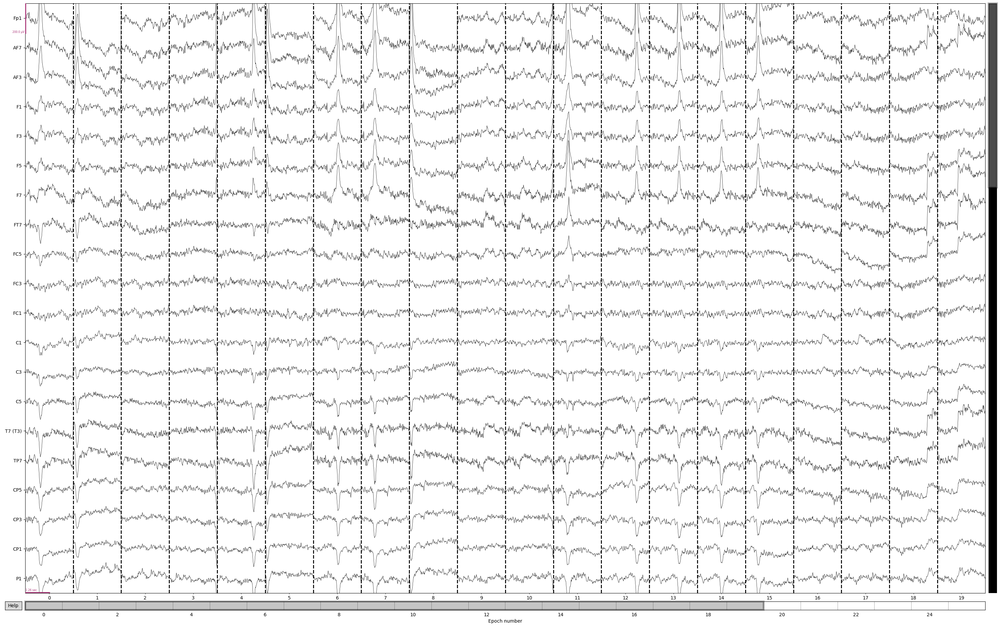

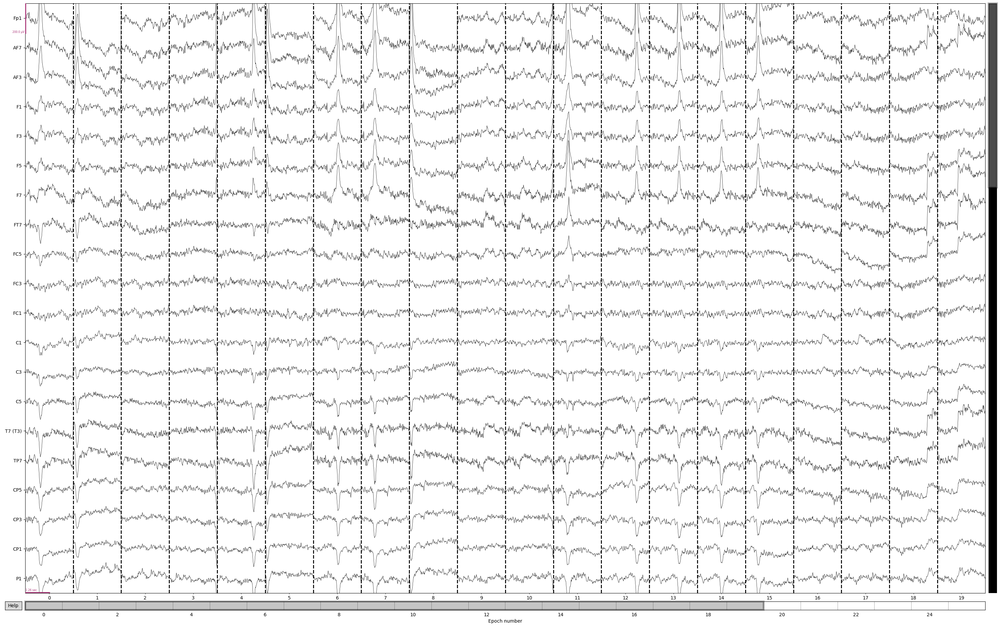

In [154]:
eps.plot(scalings=0.0001)


In [83]:
wholeExpDict

{'Listening': [<Epochs |  26 events (all good), -0.5 - 2 sec, baseline -0.5 – 0 sec, ~92 kB, data not loaded, with metadata,
   'A4': 4
   'G4': 3
   'D5': 2
   'F4': 2
   'C5': 8
   'A♯4': 7>,
  <Epochs |  26 events (all good), -0.5 - 2 sec, baseline -0.5 – 0 sec, ~92 kB, data not loaded, with metadata,
   'A4': 4
   'G4': 3
   'D5': 2
   'F4': 2
   'C5': 8
   'A♯4': 7>,
  <Epochs |  28 events (all good), -0.5 - 2 sec, baseline -0.5 – 0 sec, ~92 kB, data not loaded, with metadata,
   'A4': 3
   'G4': 9
   'E4': 3
   'F4': 6
   'C5': 1
   'A♯4': 2
   'C4': 1
   'D4': 2
   'C♯4': 1>,
  <Epochs |  28 events (all good), -0.5 - 2 sec, baseline -0.5 – 0 sec, ~92 kB, data not loaded, with metadata,
   'A4': 3
   'G4': 9
   'E4': 3
   'F4': 6
   'C5': 1
   'A♯4': 2
   'C4': 1
   'D4': 2
   'C♯4': 1>,
  <Epochs |  36 events (all good), -0.5 - 2 sec, baseline -0.5 – 0 sec, ~92 kB, data not loaded, with metadata,
   'C♯5': 11
   'C5': 9
   'A♯4': 5
   'F5': 4
   'D♯5': 6
   'G♯4': 1>,
  <Epochs 

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Using data from preloaded Raw for 26 events and 161 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


C:\Users\dillc\AppData\Roaming\Python\Python39\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


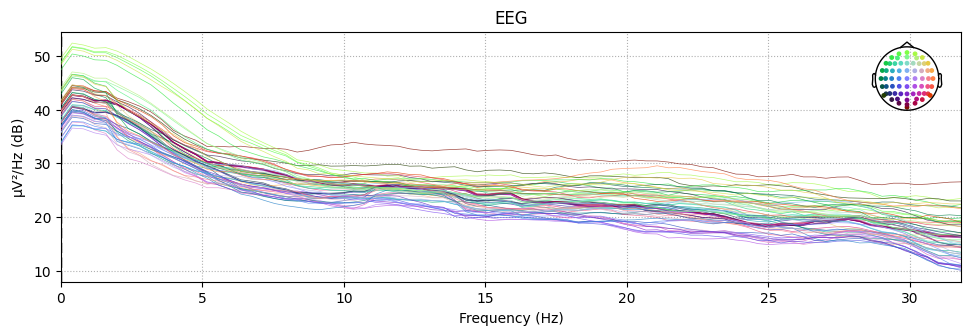

In [105]:
wholeExpDict['Listening'][0].plot_psd()

In [107]:
wholeExpDict['Listening'][0].metadata[:5]

,song_type,midi_note_label,str_note_label,expectation_value,note_dur
0,chor-096,65.0,F4,2.690927,[0.6]
1,chor-096,65.0,F4,1.930427,[0.6000000000000001]
2,chor-096,70.0,A♯4,8.161860,[1.2]
3,chor-096,67.0,G4,4.895071,[0.6000000000000001]
4,chor-096,69.0,A4,6.151374,[1.1999999999999997]


In [72]:
comb_eps = mne.concatenate_epochs(wholeExpDict['Listening'])

Using data from preloaded Raw for 27 events and 161 original time points ...
1 bad epochs dropped
Using data from preloaded Raw for 27 events and 161 original time points ...
1 bad epochs dropped
Using data from preloaded Raw for 28 events and 161 original time points ...
0 bad epochs dropped
Using data from preloaded Raw for 28 events and 161 original time points ...
0 bad epochs dropped
Using data from preloaded Raw for 38 events and 161 original time points ...
2 bad epochs dropped
Using data from preloaded Raw for 38 events and 161 original time points ...
2 bad epochs dropped
Using data from preloaded Raw for 38 events and 161 original time points ...
2 bad epochs dropped
Using data from preloaded Raw for 29 events and 161 original time points ...
2 bad epochs dropped
Using data from preloaded Raw for 27 events and 161 original time points ...
1 bad epochs dropped
Using data from preloaded Raw for 27 events and 161 original time points ...
1 bad epochs dropped
Using data from prel

NOTE KIND: A4


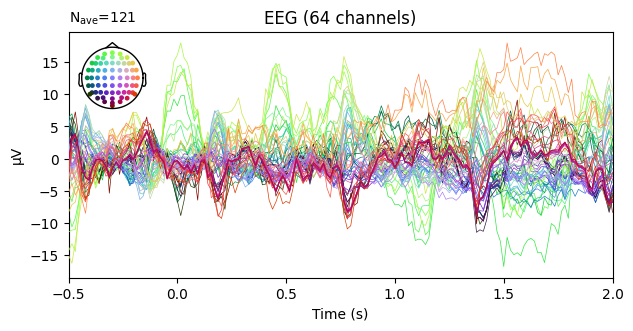

NOTE KIND: G4


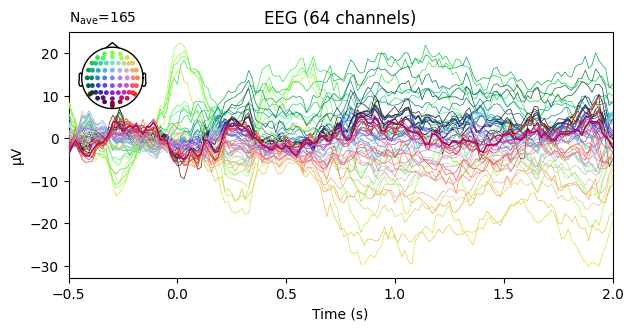

NOTE KIND: D5


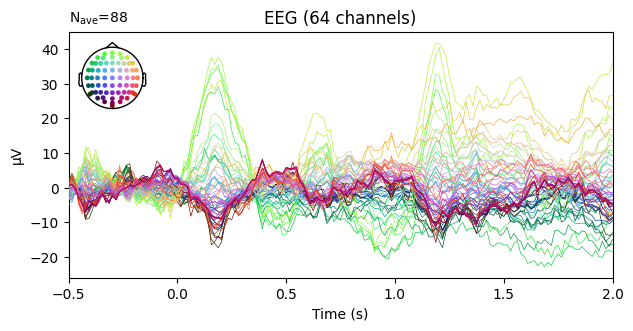

NOTE KIND: F4


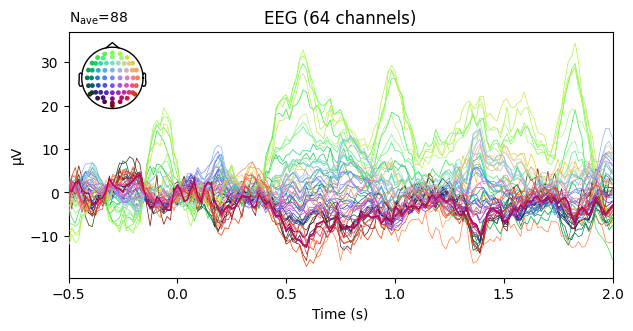

NOTE KIND: C5


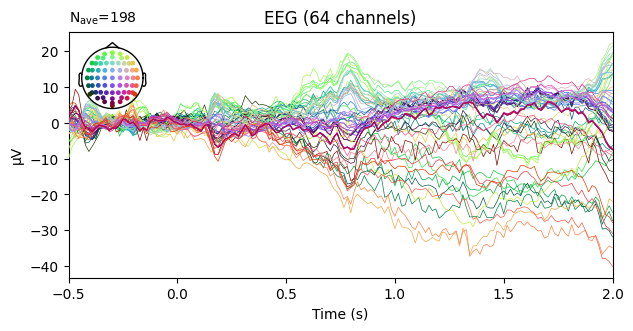

NOTE KIND: A♯4


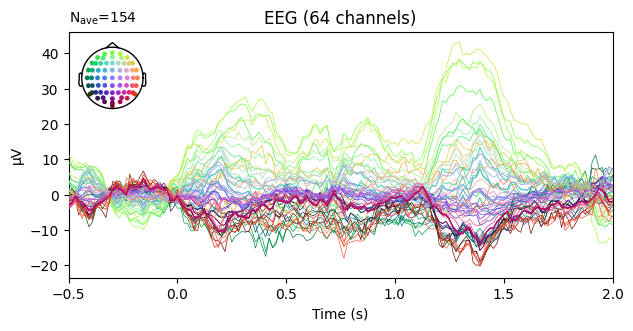

NOTE KIND: E4


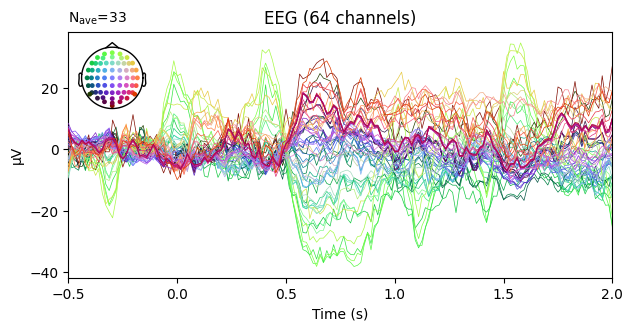

NOTE KIND: C4


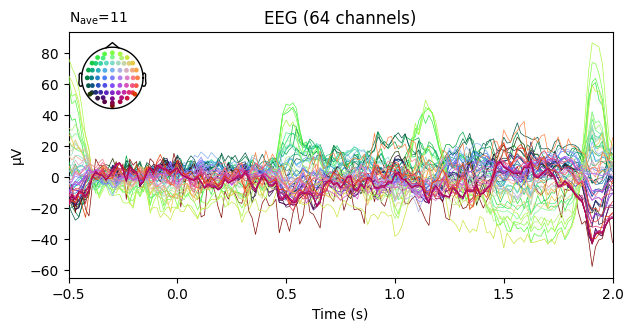

NOTE KIND: D4


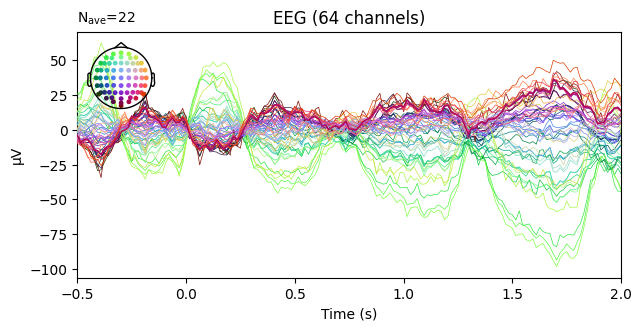

NOTE KIND: C♯4


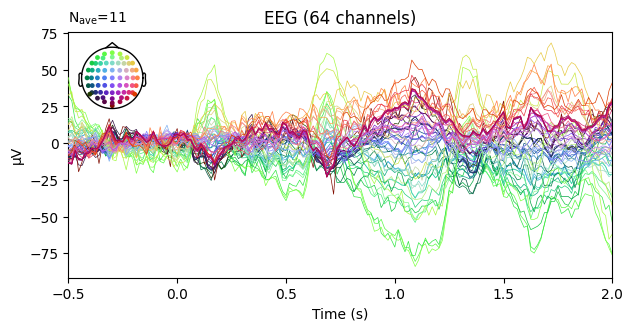

NOTE KIND: C♯5


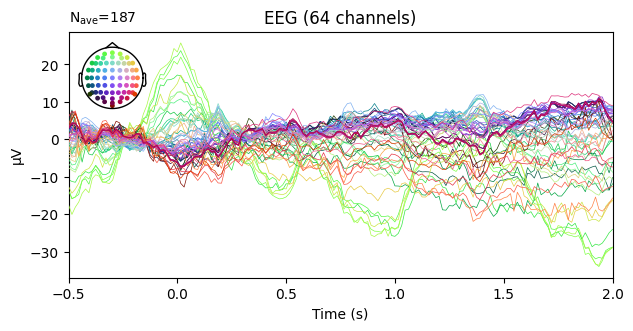

NOTE KIND: F5


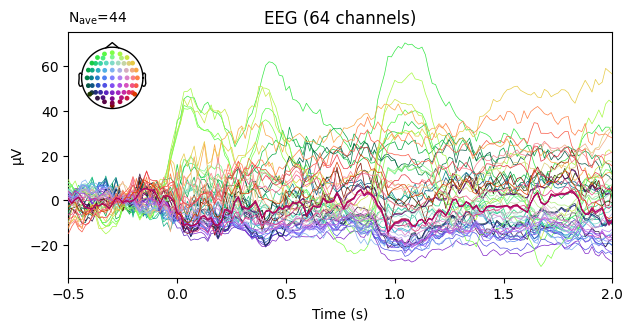

NOTE KIND: D♯5


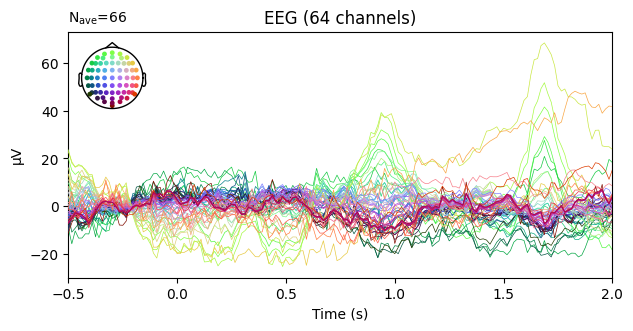

NOTE KIND: G♯4


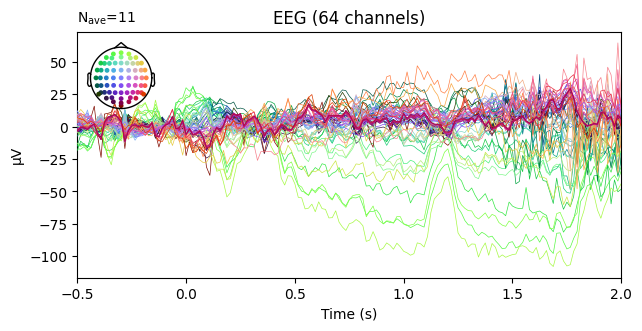

NOTE KIND: F♯4


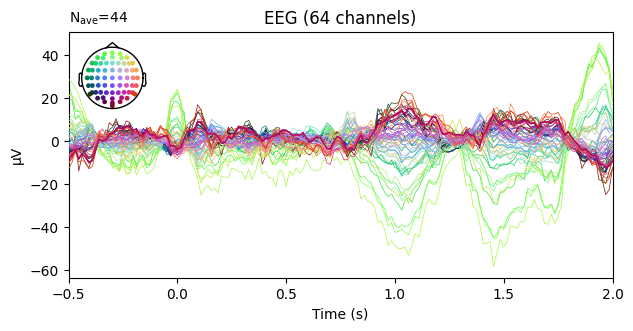

NOTE KIND: B4


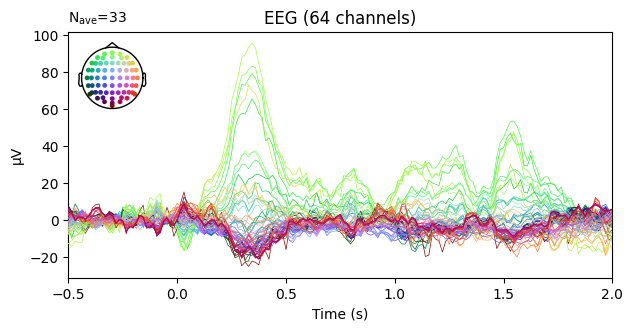

NOTE KIND: E5


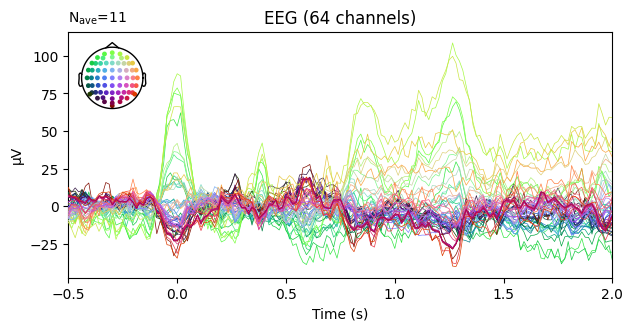

In [96]:
for note_type in comb_eps.event_id.keys():
    plt.close()
    print('NOTE KIND: '+note_type)
    comb_eps[note_type].average().plot(window_title=note_type)
    plt.show()

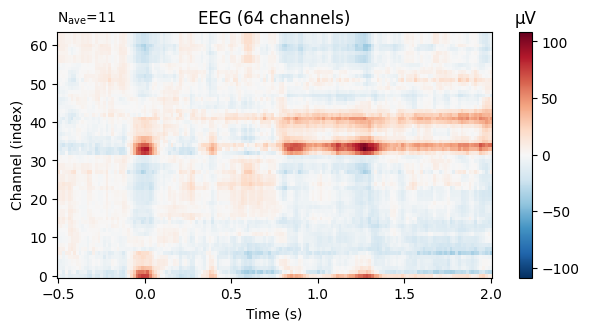

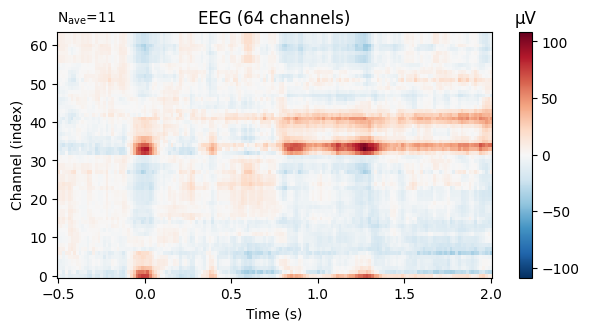

In [101]:
comb_eps[note_type].average().plot_image()